In [2]:
import tensorflow as tf
import os
import pandas as pd
from tensorflow import keras
import sklearn
from sklearn.model_selection import train_test_split
import numpy as np
np.random.seed(42)
import matplotlib as mpl
import matplotlib.pyplot as plt
import json

Load and split data into Train Set, Validation Set, and Test Set

In [3]:
# Dataset directories
# raw-img
# small-data-set
dataset_dir = ".\\raw-img"

file_paths = []
labels = []

for class_dir in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_dir)
    if os.path.isdir(class_path):
        for img_file in os.listdir(class_path):
            file_paths.append(os.path.join(class_path, img_file))
            labels.append(class_dir)

data = pd.DataFrame({
    "file_path": file_paths,
    "label": labels
})

train_df, test_df = train_test_split(
    data,
    test_size = .2,
    stratify=data["label"],
    random_state = 42)
validation_df, test_df = train_test_split(
    test_df, 
    test_size = .5, 
    stratify=test_df["label"], 
    random_state = 42)


In [4]:
train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale = 1.0/255,
    validation_split = 0.2,
    rotation_range = 0.2,
    height_shift_range = 0.2,
    #shear_range = 0.2,
    #zoom_range = 0.2,
    horizontal_flip = True,
    vertical_flip = True,
    brightness_range = [0.8, 1.2],
    fill_mode = "nearest"
)

val_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale= 1.0/255)
test_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1.0/255)

train_generator = train_gen.flow_from_dataframe(
    train_df,
    x_col = "file_path",
    y_col = "label",
    target_size = (224, 224),
    batch_size = 16,
    class_mode = "categorical"
)

validation_generator = val_gen.flow_from_dataframe(
    validation_df,
    x_col = "file_path",
    y_col = "label",
    target_size = (224, 224),
    batch_size = 16,
    class_mode = "categorical"
)

test_generator = test_gen.flow_from_dataframe(
    test_df,
    x_col = "file_path",
    y_col = "label",
    target_size = (224, 224),
    batch_size = 16,
    class_mode = "categorical"
)


# train set
class_indices = train_generator.class_indices
class_labels = {v: k for k, v in class_indices.items()} # to get label names from indices

print("animal labels:", class_labels)

with open("animal_labels.json", "w") as f:
    json.dump(class_labels, f)


Found 20943 validated image filenames belonging to 10 classes.
Found 2618 validated image filenames belonging to 10 classes.
Found 2618 validated image filenames belonging to 10 classes.
animal labels: {0: 'butterfly', 1: 'cat', 2: 'chicken', 3: 'cow', 4: 'dog', 5: 'elephant', 6: 'horse', 7: 'sheep', 8: 'spider', 9: 'squirrel'}


Inspect the data from the Training Set

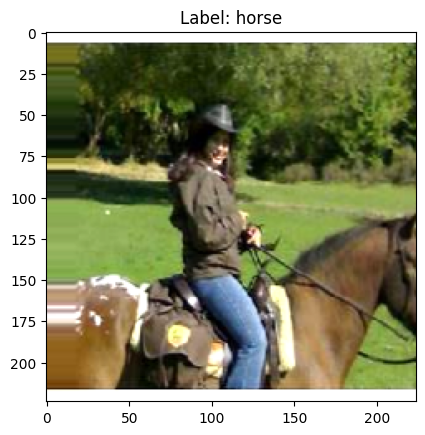

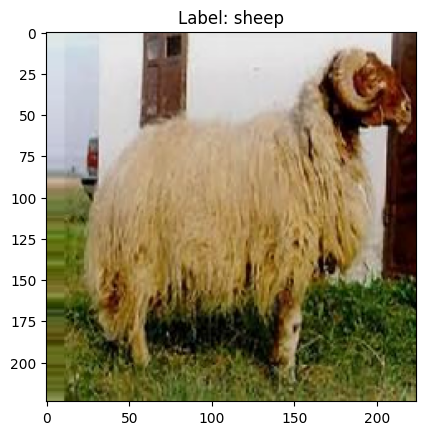

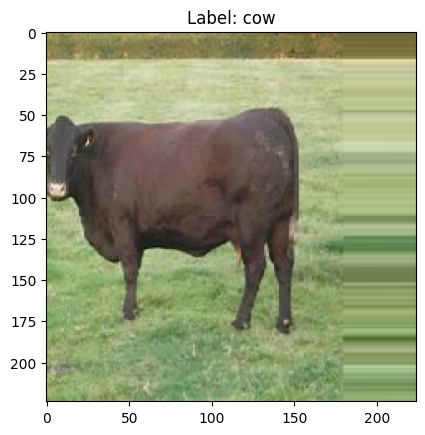

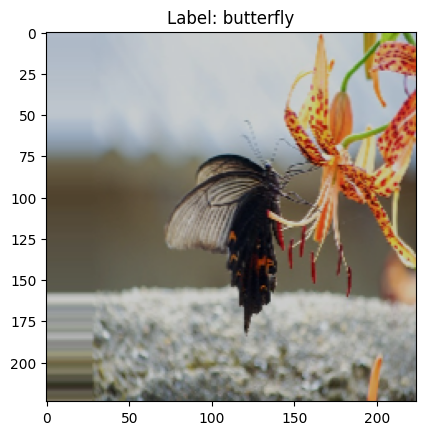

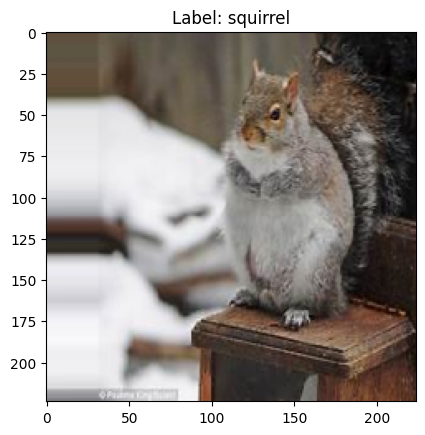

In [4]:
images, labels = next(train_generator)

# Plot the first 5 images in the batch
for i in range(5):
    plt.imshow(images[i])
    plt.title(f"Label: {class_labels[np.argmax(labels[i])]}")
    plt.show()

Build a neural network model

Things to consider:
* Include Learning Rate Scheduler.
* Tune Dropout Rates and Regularization.
* Monitor training and validation metrics visually.
* Use Keras Tuner for automated hyperparameter optimization (if desired).

In [5]:
# Convolutional Neural Network
model = tf.keras.Sequential([
    # Input Layer
    tf.keras.Input(shape=[224, 224, 3]),

    # Convolutional 1
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding="same"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2),

    # Convolutional 2
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding="same"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
    
    # Convolutional 3
    tf.keras.layers.Conv2D(filters=256, kernel_size=3, padding="same"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2),

    # Convolutional 4
    tf.keras.layers.Conv2D(filters=512, kernel_size=3, padding="same"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2),

    # Convolutional 5
    tf.keras.layers.Conv2D(filters=512, kernel_size=3, padding="same"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2),

    # Global Average Pooling (Replacing Flatenning)
    tf.keras.layers.GlobalAveragePooling2D(),
    # tf.keras.layers.Flatten(),              # Flatenning
    
    tf.keras.layers.Dense(units=256, activation="relu"),    # Full Connection1
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(units=128, activation="relu"),     # Full Connection2
    tf.keras.layers.Dropout(0.3),

    # Output Layer
    tf.keras.layers.Dense(len(class_indices), activation="softmax")
])
    

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 112, 112, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 56, 56, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 28, 28, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       131,32

 Total params: 4,082,186 (15.57 MB)

 Trainable params: 4,079,242 (15.56 MB)

 Non-trainable params: 2,944 (11.50 KB)

In [6]:
model.compile(loss="categorical_crossentropy",
              optimizer="adam",
              metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

Training neural network model

In [8]:
# Ensure there are images in both generators
assert train_generator.samples > 0, "Training generator has no images!"
assert validation_generator.samples > 0, "Validation generator has no images!"

# Early Stopping to stop the training when validation loss stops improving
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor = "val_loss",
    patience = 5,
    restore_best_weights = True
)

tf.debugging.set_log_device_placement(True)

history = model.fit( 
    train_generator, 
    steps_per_epoch = train_generator.samples // train_generator.batch_size, 
    validation_data = validation_generator, 
    validation_steps = validation_generator.samples // validation_generator.batch_size, 
    epochs = 20,
    callbacks = [early_stopping]
)

Epoch 1/20
1308/1308 ━━━━━━━━━━━━━━━━━━━━ 2150s 2s/step - accuracy: 0.2332 - loss: 2.1453 - precision: 0.4912 - recall: 0.0283 - val_accuracy: 0.3305 - val_loss: 1.9182 - val_precision: 0.5674 - val_recall: 0.0855
Epoch 2/20
   1/1308 ━━━━━━━━━━━━━━━━━━━━ 29:20 1s/step - accuracy: 0.0625 - loss: 2.2531 - precision: 0.0000e+00 - recall: 0.0000e+00

c:\Users\shini\AppData\Local\Programs\Python\Python312\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


1308/1308 ━━━━━━━━━━━━━━━━━━━━ 2s 252us/step - accuracy: 0.0625 - loss: 2.2531 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.3000 - val_loss: 2.1414 - val_precision: 0.5000 - val_recall: 0.1000
Epoch 3/20
1308/1308 ━━━━━━━━━━━━━━━━━━━━ 2272s 2s/step - accuracy: 0.3436 - loss: 1.8997 - precision: 0.6161 - recall: 0.0936 - val_accuracy: 0.3301 - val_loss: 1.8391 - val_precision: 0.7121 - val_recall: 0.1081
Epoch 4/20
1308/1308 ━━━━━━━━━━━━━━━━━━━━ 2s 181us/step - accuracy: 0.6875 - loss: 1.2401 - precision: 0.8000 - recall: 0.2500 - val_accuracy: 0.1000 - val_loss: 2.0192 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/20
1308/1308 ━━━━━━━━━━━━━━━━━━━━ 2112s 2s/step - accuracy: 0.4128 - loss: 1.7000 - precision: 0.6810 - recall: 0.1700 - val_accuracy: 0.4310 - val_loss: 1.5984 - val_precision: 0.6610 - val_recall: 0.2535
Epoch 6/20
1308/1308 ━━━━━━━━━━━━━━━━━━━━ 2s 178us/step - accuracy: 0.3125 - loss: 1.6315 - precision: 0.6667 - recall: 0.2500 - val_accura

Save model for reuse without retraining

In [9]:
model.save("animal_classifier_model.h5")
model.save("animal_classifier_model.keras")

Evaluation

In [ ]:
model = tf.keras.models.load_model('animal_classifier_model.keras')

score = model.evaluate(validation_generator)
print(f"Total loss on Validation Set: {score[0]}")
print(f"Accuracy of   Validation Set: {score[1]}")
print(f"Precision of  Validation Set: {score[2]}")
print(f"Recall of     Validation Set: {score[3]}\n")

score = model.evaluate(test_generator)
print(f"Total loss on Test Set: {score[0]}")
print(f"Accuracy of   Test Set: {score[1]}")
print(f"Precision of  Test Set: {score[2]}")
print(f"Recall of     Test Set: {score[3]}")

164/164 ━━━━━━━━━━━━━━━━━━━━ 53s 311ms/step - accuracy: 0.5261 - loss: 1.3153 - precision: 0.7817 - recall: 0.2800
Total loss on Validation Set: 1.2925360202789307
Accuracy of   Validation Set: 0.5355232954025269
Precision of  Validation Set: 0.7886598110198975
Recall of     Validation Set: 0.2922077775001526

164/164 ━━━━━━━━━━━━━━━━━━━━ 51s 310ms/step - accuracy: 0.5380 - loss: 1.3153 - precision: 0.7943 - recall: 0.2789
Total loss on Test Set: 1.3179303407669067
Accuracy of   Test Set: 0.5435447096824646
Precision of  Test Set: 0.7980871200561523
Recall of     Test Set: 0.2868601977825165


Training History Analysis

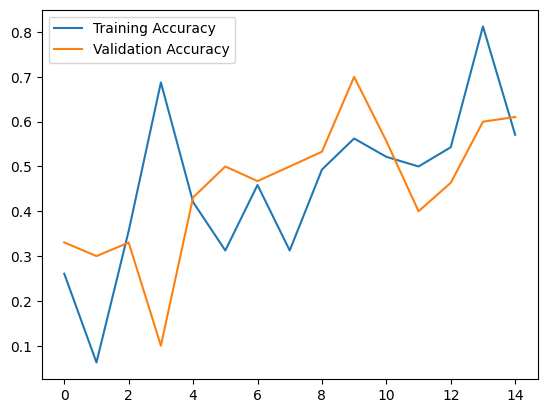

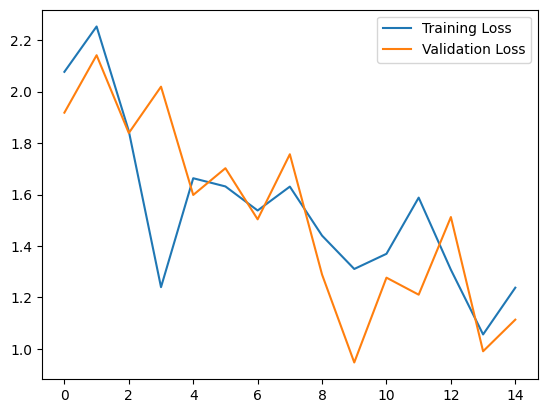

In [11]:
# Plot accuracy
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.legend()
plt.show()

# Plot loss
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()

Predicting images from Validation Set and Test Set to see how the model performs

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

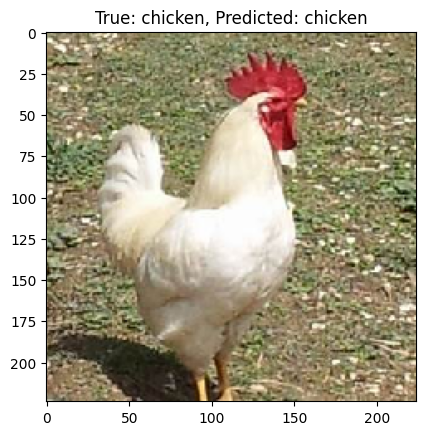

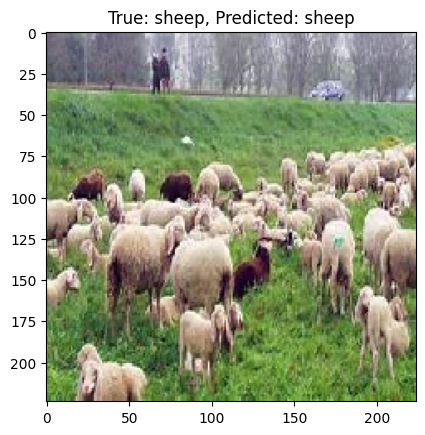

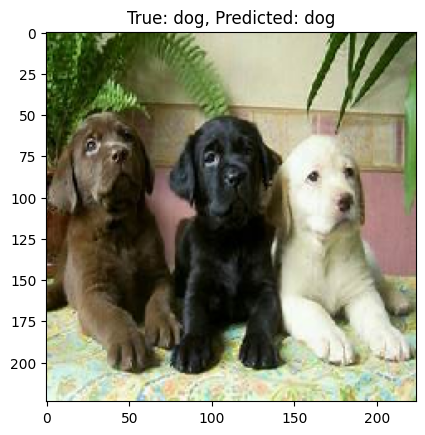

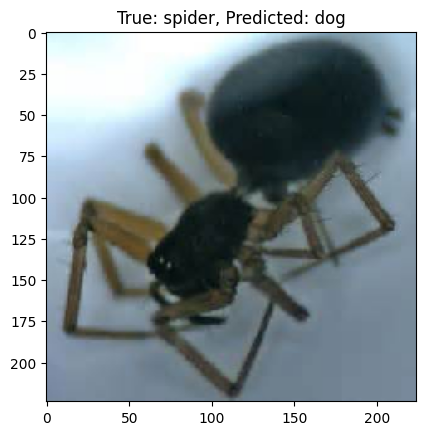

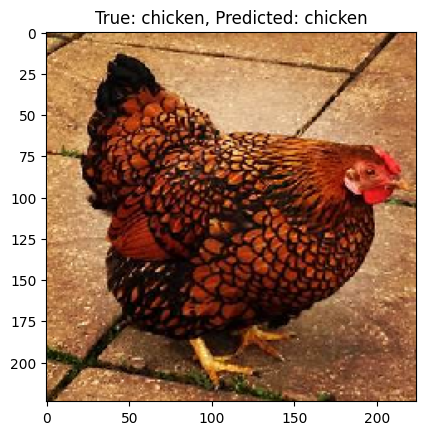

...

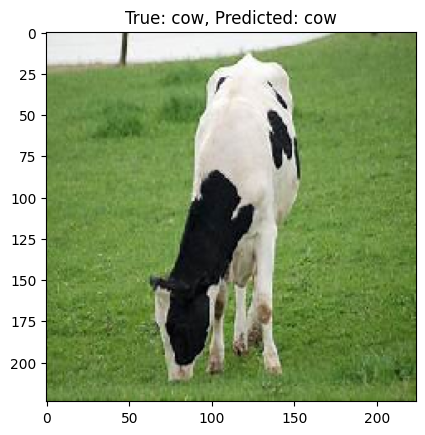

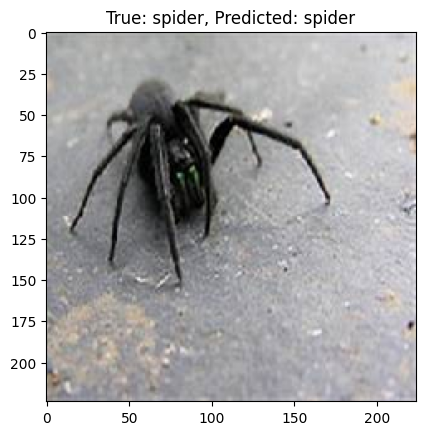

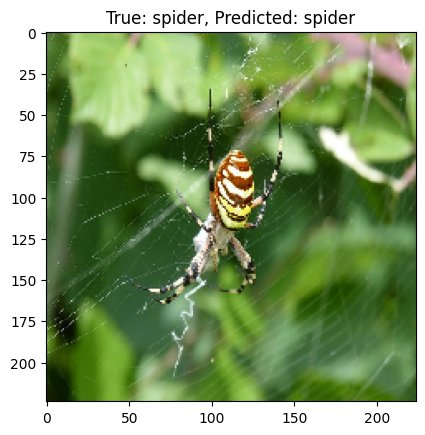

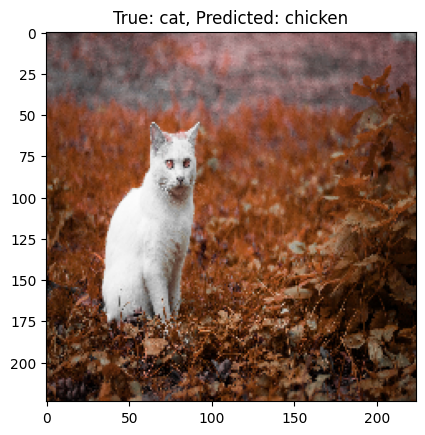

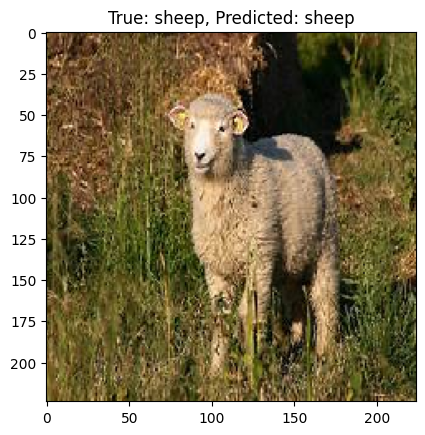

In [14]:
# Load the save trained model, so that we don't have to train the model over and over again
# animal_classifier_model.h5
# animal_classifier_model.keras
model = tf.keras.models.load_model('animal_classifier_model.keras')

# To get images from Validation Set
validation_steps = validation_generator.samples // validation_generator.batch_size
if validation_generator.samples % validation_generator.batch_size != 0:
    validation_steps += 1 # Ensure all images are included

# To get images from Test Set
test_steps = test_generator.samples // test_generator.batch_size
if test_generator.samples % test_generator.batch_size != 0:
    test_steps += 1 # Ensure all images are included

# Change the comment here to test different set

# Validation Set
# prediction_range = validation_steps
# prediction_generator = validation_generator
# prediction_samples = validation_generator.samples

# Test Set
prediction_range = test_steps
prediction_generator = test_generator
prediction_samples = test_generator.samples

all_predictions = []
all_true_labels = []
all_images = []

for step in range(prediction_range):
    images, labels = next(prediction_generator)
    predictions = model.predict(images)
    all_predictions.extend(np.argmax(predictions, axis = 1))
    all_true_labels.extend(np.argmax(labels, axis = 1))
    all_images.extend(images)

all_predictions = np.array(all_predictions)
all_true_labels = np.array(all_true_labels)

correct_predictions = np.sum(all_predictions == all_true_labels)
accuracy = correct_predictions / len(all_true_labels)
print(f"Correct Prediction: {correct_predictions}/{prediction_samples}")
print(f"Validation Accuracy: {accuracy * 100:.2f}%")

# Visualize a few predictions
for i in range(50):
    plt.imshow(all_images[i])
    true_label = class_labels[all_true_labels[i]]
    predicted_label = class_labels[all_predictions[i]]
    plt.title(f"True: {true_label}, Predicted: {predicted_label}")
    plt.show()
